In [22]:
!pip install -q efficientnet

In [23]:
import random, re, math
import numpy as np, pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix
from sklearn.model_selection import KFold

import tensorflow as tf, tensorflow.keras.backend as K
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, LearningRateScheduler

import efficientnet.tfkeras as efn

from kaggle_datasets import KaggleDatasets

print('Tensorflow version ' + tf.__version__)

Tensorflow version 2.4.1


In [24]:
# Detect TPU, return appropriate distribution strategy
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver() 
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
    strategy = tf.distribute.get_strategy() 

print("REPLICAS: ", strategy.num_replicas_in_sync)

Running on TPU  grpc://10.0.0.2:8470


2021-12-26 15:32:25.965484: I tensorflow/core/distributed_runtime/rpc/grpc_channel.cc:301] Initialize GrpcChannelCache for job worker -> {0 -> 10.0.0.2:8470}
2021-12-26 15:32:25.965933: I tensorflow/core/distributed_runtime/rpc/grpc_channel.cc:301] Initialize GrpcChannelCache for job localhost -> {0 -> localhost:30060}
2021-12-26 15:32:25.971085: I tensorflow/core/distributed_runtime/rpc/grpc_channel.cc:301] Initialize GrpcChannelCache for job worker -> {0 -> 10.0.0.2:8470}
2021-12-26 15:32:25.971290: I tensorflow/core/distributed_runtime/rpc/grpc_channel.cc:301] Initialize GrpcChannelCache for job localhost -> {0 -> localhost:30060}


REPLICAS:  8


In [25]:
GCS_DS_PATH = KaggleDatasets().get_gcs_path('tpu-getting-started')
print(GCS_DS_PATH)

gs://kds-a04246bb35ae39a4cd5f0e91824a915a35d2cec2c61f8a77894805f4


In [26]:
IMAGE_SIZE = [512, 512]  
HEIGHT = 512
WIDTH = 512
CHANNELS=3

EPOCHS = 30
BATCH_SIZE = 16 * strategy.num_replicas_in_sync
WARMUP_LEARNING_RATE = 1e-4 * strategy.num_replicas_in_sync
LEARNING_RATE = 3e-5 * strategy.num_replicas_in_sync

AUTO = tf.data.experimental.AUTOTUNE
NUM_CLASSES = 104
ES_PATIENCE = 3
SEED = 123

model_path = f'model_{HEIGHT}x{WIDTH}.h5'

GCS_PATH = GCS_DS_PATH + '/tfrecords-jpeg-512x512'

TRAINING_FILENAMES = tf.io.gfile.glob(GCS_PATH + '/train/*.tfrec')
VALIDATION_FILENAMES = tf.io.gfile.glob(GCS_PATH + '/val/*.tfrec')
TEST_FILENAMES = tf.io.gfile.glob(GCS_PATH + '/test/*.tfrec')

2021-12-26 15:32:32.925640: I tensorflow/core/platform/cloud/google_auth_provider.cc:180] Attempting an empty bearer token since no token was retrieved from files, and GCE metadata check was skipped.
2021-12-26 15:32:32.994993: I tensorflow/core/platform/cloud/google_auth_provider.cc:180] Attempting an empty bearer token since no token was retrieved from files, and GCE metadata check was skipped.
2021-12-26 15:32:33.061082: I tensorflow/core/platform/cloud/google_auth_provider.cc:180] Attempting an empty bearer token since no token was retrieved from files, and GCE metadata check was skipped.


In [27]:
CLASSES = ['pink primrose',    'hard-leaved pocket orchid', 'canterbury bells', 'sweet pea',     'wild geranium',     'tiger lily',           'moon orchid',              'bird of paradise', 'monkshood',        'globe thistle',         # 00 - 09
           'snapdragon',       "colt's foot",               'king protea',      'spear thistle', 'yellow iris',       'globe-flower',         'purple coneflower',        'peruvian lily',    'balloon flower',   'giant white arum lily', # 10 - 19
           'fire lily',        'pincushion flower',         'fritillary',       'red ginger',    'grape hyacinth',    'corn poppy',           'prince of wales feathers', 'stemless gentian', 'artichoke',        'sweet william',         # 20 - 29
           'carnation',        'garden phlox',              'love in the mist', 'cosmos',        'alpine sea holly',  'ruby-lipped cattleya', 'cape flower',              'great masterwort', 'siam tulip',       'lenten rose',           # 30 - 39
           'barberton daisy',  'daffodil',                  'sword lily',       'poinsettia',    'bolero deep blue',  'wallflower',           'marigold',                 'buttercup',        'daisy',            'common dandelion',      # 40 - 49
           'petunia',          'wild pansy',                'primula',          'sunflower',     'lilac hibiscus',    'bishop of llandaff',   'gaura',                    'geranium',         'orange dahlia',    'pink-yellow dahlia',    # 50 - 59
           'cautleya spicata', 'japanese anemone',          'black-eyed susan', 'silverbush',    'californian poppy', 'osteospermum',         'spring crocus',            'iris',             'windflower',       'tree poppy',            # 60 - 69
           'gazania',          'azalea',                    'water lily',       'rose',          'thorn apple',       'morning glory',        'passion flower',           'lotus',            'toad lily',        'anthurium',             # 70 - 79
           'frangipani',       'clematis',                  'hibiscus',         'columbine',     'desert-rose',       'tree mallow',          'magnolia',                 'cyclamen ',        'watercress',       'canna lily',            # 80 - 89
           'hippeastrum ',     'bee balm',                  'pink quill',       'foxglove',      'bougainvillea',     'camellia',             'mallow',                   'mexican petunia',  'bromelia',         'blanket flower',        # 90 - 99
           'trumpet creeper',  'blackberry lily',           'common tulip',     'wild rose']                                                                                                                                               # 100 - 102

In [28]:
np.set_printoptions(threshold=15, linewidth=80)

In [29]:
def decode_image(image_data):
    """
    Reads in a jpeg image file and converts casts it into a uint8 tensor.
    Each cell in the tensor contains numerical information about a given
    pixel in the original jpeg image. The code then resizes the tensor
    to the appropraite size to be used by the TPU. If we want to decoe
    other file types we need to modify the "decode_jpeg" portion of the
    code to use other file extensions.
    """
    image = tf.image.decode_jpeg(image_data, channels=3)
    image = tf.cast(image, tf.float32) / 255.0  # convert image to floats in [0, 1] range
    image = tf.reshape(image, [*IMAGE_SIZE, 3]) # explicit size needed for TPU
    return image

def read_labeled_tfrecord(example):
    """
    Takes a classified file and decodes the image returning the label
    """
    LABELED_TFREC_FORMAT = {
        "image": tf.io.FixedLenFeature([], tf.string), # tf.string means bytestring
        "class": tf.io.FixedLenFeature([], tf.int64),  # shape [] means single element
    }
    example = tf.io.parse_single_example(example, LABELED_TFREC_FORMAT)
    image = decode_image(example['image'])
    label = tf.cast(example['class'], tf.int32)
    return image, label # returns a dataset of (image, label) pairs

def read_unlabeled_tfrecord(example):
    """
    Takes an unclassified file and decodes the image with the id associated
    """
    UNLABELED_TFREC_FORMAT = {
        "image": tf.io.FixedLenFeature([], tf.string), # tf.string means bytestring
        "id": tf.io.FixedLenFeature([], tf.string),  # shape [] means single element
        # class is missing, this competitions's challenge is to predict flower classes for the test dataset
    }
    example = tf.io.parse_single_example(example, UNLABELED_TFREC_FORMAT)
    image = decode_image(example['image'])
    idnum = example['id']
    return image, idnum # returns a dataset of image(s)

def load_dataset(filenames, labeled=True, ordered=False):
    """
    Read from TFRecords. For optimal performance, reading from multiple files at once and
    disregarding data order. Order does not matter since we will be shuffling the data anyway.
    """
    ignore_order = tf.data.Options()
    if not ordered:
        ignore_order.experimental_deterministic = False # disable order, increase speed

    dataset = tf.data.TFRecordDataset(filenames, num_parallel_reads=AUTO) # automatically interleaves reads from multiple files
    dataset = dataset.with_options(ignore_order) # uses data as soon as it streams in, rather than in its original order
    dataset = dataset.map(read_labeled_tfrecord if labeled else read_unlabeled_tfrecord, num_parallel_calls=AUTO)
    # returns a dataset of (image, label) pairs if labeled=True or (image, id) pairs if labeled=False
    return dataset

# data augmentation @cdeotte kernel: https://www.kaggle.com/cdeotte/rotation-augmentation-gpu-tpu-0-96
def transform_rotation(image, height, rotation):
    # input image - is one image of size [dim,dim,3] not a batch of [b,dim,dim,3]
    # output - image randomly rotated
    DIM = height
    XDIM = DIM%2 #fix for size 331
    
    rotation = rotation * tf.random.uniform([1],dtype='float32')
    # CONVERT DEGREES TO RADIANS
    rotation = math.pi * rotation / 180.
    
    # ROTATION MATRIX
    c1 = tf.math.cos(rotation)
    s1 = tf.math.sin(rotation)
    one = tf.constant([1],dtype='float32')
    zero = tf.constant([0],dtype='float32')
    rotation_matrix = tf.reshape(tf.concat([c1,s1,zero, -s1,c1,zero, zero,zero,one],axis=0),[3,3])

    # LIST DESTINATION PIXEL INDICES
    x = tf.repeat( tf.range(DIM//2,-DIM//2,-1), DIM )
    y = tf.tile( tf.range(-DIM//2,DIM//2),[DIM] )
    z = tf.ones([DIM*DIM],dtype='int32')
    idx = tf.stack( [x,y,z] )
    
    # ROTATE DESTINATION PIXELS ONTO ORIGIN PIXELS
    idx2 = K.dot(rotation_matrix,tf.cast(idx,dtype='float32'))
    idx2 = K.cast(idx2,dtype='int32')
    idx2 = K.clip(idx2,-DIM//2+XDIM+1,DIM//2)
    
    # FIND ORIGIN PIXEL VALUES 
    idx3 = tf.stack( [DIM//2-idx2[0,], DIM//2-1+idx2[1,]] )
    d = tf.gather_nd(image, tf.transpose(idx3))
        
    return tf.reshape(d,[DIM,DIM,3])

def transform_shear(image, height, shear):
    # input image - is one image of size [dim,dim,3] not a batch of [b,dim,dim,3]
    # output - image randomly sheared
    DIM = height
    XDIM = DIM%2 #fix for size 331
    
    shear = shear * tf.random.uniform([1],dtype='float32')
    shear = math.pi * shear / 180.
        
    # SHEAR MATRIX
    one = tf.constant([1],dtype='float32')
    zero = tf.constant([0],dtype='float32')
    c2 = tf.math.cos(shear)
    s2 = tf.math.sin(shear)
    shear_matrix = tf.reshape(tf.concat([one,s2,zero, zero,c2,zero, zero,zero,one],axis=0),[3,3])    

    # LIST DESTINATION PIXEL INDICES
    x = tf.repeat( tf.range(DIM//2,-DIM//2,-1), DIM )
    y = tf.tile( tf.range(-DIM//2,DIM//2),[DIM] )
    z = tf.ones([DIM*DIM],dtype='int32')
    idx = tf.stack( [x,y,z] )
    
    # ROTATE DESTINATION PIXELS ONTO ORIGIN PIXELS
    idx2 = K.dot(shear_matrix,tf.cast(idx,dtype='float32'))
    idx2 = K.cast(idx2,dtype='int32')
    idx2 = K.clip(idx2,-DIM//2+XDIM+1,DIM//2)
    
    # FIND ORIGIN PIXEL VALUES 
    idx3 = tf.stack( [DIM//2-idx2[0,], DIM//2-1+idx2[1,]] )
    d = tf.gather_nd(image, tf.transpose(idx3))
        
    return tf.reshape(d,[DIM,DIM,3])

def transform_shift(image, height, h_shift, w_shift):
    # input image - is one image of size [dim,dim,3] not a batch of [b,dim,dim,3]
    # output - image randomly shifted
    DIM = height
    XDIM = DIM%2 #fix for size 331
    
    height_shift = h_shift * tf.random.uniform([1],dtype='float32') 
    width_shift = w_shift * tf.random.uniform([1],dtype='float32') 
    one = tf.constant([1],dtype='float32')
    zero = tf.constant([0],dtype='float32')
        
    # SHIFT MATRIX
    shift_matrix = tf.reshape(tf.concat([one,zero,height_shift, zero,one,width_shift, zero,zero,one],axis=0),[3,3])

    # LIST DESTINATION PIXEL INDICES
    x = tf.repeat( tf.range(DIM//2,-DIM//2,-1), DIM )
    y = tf.tile( tf.range(-DIM//2,DIM//2),[DIM] )
    z = tf.ones([DIM*DIM],dtype='int32')
    idx = tf.stack( [x,y,z] )
    
    # ROTATE DESTINATION PIXELS ONTO ORIGIN PIXELS
    idx2 = K.dot(shift_matrix,tf.cast(idx,dtype='float32'))
    idx2 = K.cast(idx2,dtype='int32')
    idx2 = K.clip(idx2,-DIM//2+XDIM+1,DIM//2)
    
    # FIND ORIGIN PIXEL VALUES 
    idx3 = tf.stack( [DIM//2-idx2[0,], DIM//2-1+idx2[1,]] )
    d = tf.gather_nd(image, tf.transpose(idx3))
        
    return tf.reshape(d,[DIM,DIM,3])

def data_augment(image, label):
    """
    This is the data augmentation function given in the tutorial
    
    Thanks to the dataset.prefetch(AUTO)
    statement in the next function (below), this happens essentially
    for free on TPU. Data pipeline code is executed on the "CPU"
    part of the TPU while the TPU itself is computing gradients.
    """
    image = tf.image.random_flip_left_right(image)
    #image = tf.image.random_saturation(image, 0, 2)
    return image, label   

def augment(image,label):
    """
    data augmentation taken from 
    https://www.kaggle.com/dimitreoliveira/flower-with-tpus-advanced-augmentations#Model-(EfficientNet)
    """
    p_rotation = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_spatial = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_rotate = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_pixel = tf.random.uniform([], 0, 1.0, dtype=tf.float32)    
    p_shear = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_shift = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_crop = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    
    
    # Flips
    if p_spatial >= .2:
        image = tf.image.random_flip_left_right(image)
        image = tf.image.random_flip_up_down(image)
        
    # Rotates
    if p_rotate > .75:
        image = tf.image.rot90(image, k=3) # rotate 270º
    elif p_rotate > .5:
        image = tf.image.rot90(image, k=2) # rotate 180º
    elif p_rotate > .25:
        image = tf.image.rot90(image, k=1) # rotate 90º
    
    if p_rotation >= .3: # Rotation
        image = transform_rotation(image, height=HEIGHT, rotation=45.)
    if p_shift >= .3: # Shift
        image = transform_shift(image, height=HEIGHT, h_shift=15., w_shift=15.)
    if p_shear >= .3: # Shear
        image = transform_shear(image, height=HEIGHT, shear=20.)
        
    # Crops
    if p_crop > .4:
        crop_size = tf.random.uniform([], int(HEIGHT*.7), HEIGHT, dtype=tf.int32)
        image = tf.image.random_crop(image, size=[crop_size, crop_size, CHANNELS])
    elif p_crop > .7:
        if p_crop > .9:
            image = tf.image.central_crop(image, central_fraction=.7)
        elif p_crop > .8:
            image = tf.image.central_crop(image, central_fraction=.8)
        else:
            image = tf.image.central_crop(image, central_fraction=.9)
            
    image = tf.image.resize(image, size=[HEIGHT, WIDTH])
        
    # Pixel-level transforms
    if p_pixel >= .2:
        if p_pixel >= .8:
            image = tf.image.random_saturation(image, lower=0, upper=2)
        elif p_pixel >= .6:
            image = tf.image.random_contrast(image, lower=.8, upper=2)
        elif p_pixel >= .4:
            image = tf.image.random_brightness(image, max_delta=.2)
        else:
            image = tf.image.adjust_gamma(image, gamma=.6)

    return image, label

def get_training_dataset(aug='old'):
    """
    Reads in the training dataset and shuffles it around
    """
    if aug == 'new':
        aug_arg = augment
    else:
        aug_arg = data_augment
    dataset = load_dataset(TRAINING_FILENAMES, labeled=True)
    dataset = dataset.map(aug_arg, num_parallel_calls=AUTO)
    dataset = dataset.repeat() # the training dataset must repeat for several epochs
    dataset = dataset.shuffle(2048)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTO) # prefetch next batch while training (autotune prefetch buffer size)
    return dataset

def get_training_dataset_subset(ordered=False):
    """
    Reads in a subset of the training dataset
    """
    dataset = load_dataset(TRAINING_FILENAMES, labeled=True, ordered=ordered)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.cache()
    dataset = dataset.prefetch(AUTO)
    return dataset

def get_validation_dataset(ordered=False):
    """
    Reads in the validation dataset
    """
    dataset = load_dataset(VALIDATION_FILENAMES, labeled=True, ordered=ordered)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.cache()
    dataset = dataset.prefetch(AUTO)
    return dataset

def get_test_dataset(ordered=False):
    """
    Reads in the test dataset
    """
    dataset = load_dataset(TEST_FILENAMES, labeled=False, ordered=ordered)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTO)
    return dataset

def count_data_items(filenames):
    """
    Counts the total number of items
    """
    # the number of data items is written in the name of the .tfrec
    # files, i.e. flowers00-230.tfrec = 230 data items
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1)) for filename in filenames]
    return np.sum(n)



def batch_to_numpy_images_and_labels(data):
    """
    Converts the images and labels to numpy
    """
    images, labels = data
    numpy_images = images.numpy()
    numpy_labels = labels.numpy()
    if numpy_labels.dtype == object: # binary string in this case,
                                     # these are image ID strings
        numpy_labels = [None for _ in enumerate(numpy_images)]
    # If no labels, only image IDs, return None for labels (this is
    # the case for test data)
    return numpy_images, numpy_labels

def title_from_label_and_target(label, correct_label):
    """
    Generates a title from the image label
    """
    if correct_label is None:
        return CLASSES[label], True
    correct = (label == correct_label)
    return "{} [{}{}{}]".format(CLASSES[label], 'OK' if correct else 'NO', u"\u2192" if not correct else '',
                                CLASSES[correct_label] if not correct else ''), correct

def display_one_flower(image, title, subplot, red=False, titlesize=16):
    """
    Plots a single flower image
    """
    plt.subplot(*subplot)
    plt.axis('off')
    plt.imshow(image)
    if len(title) > 0:
        plt.title(title, fontsize=int(titlesize) if not red else int(titlesize/1.2), color='red' if red else 'black', fontdict={'verticalalignment':'center'}, pad=int(titlesize/1.5))
    return (subplot[0], subplot[1], subplot[2]+1)
    
def display_batch_of_images(databatch, predictions=None):
    """
    Plots a batch of images
    
    This will work with:
    display_batch_of_images(images)
    display_batch_of_images(images, predictions)
    display_batch_of_images((images, labels))
    display_batch_of_images((images, labels), predictions)
    """
    # data
    images, labels = batch_to_numpy_images_and_labels(databatch)
    if labels is None:
        labels = [None for _ in enumerate(images)]
        
    # auto-squaring: this will drop data that does not fit into square
    # or square-ish rectangle
    rows = int(math.sqrt(len(images)))
    cols = len(images)//rows
        
    # size and spacing
    FIGSIZE = 13.0
    SPACING = 0.1
    subplot=(rows,cols,1)
    if rows < cols:
        plt.figure(figsize=(FIGSIZE,FIGSIZE/cols*rows))
    else:
        plt.figure(figsize=(FIGSIZE/rows*cols,FIGSIZE))
    
    # display
    for i, (image, label) in enumerate(zip(images[:rows*cols], labels[:rows*cols])):
        title = '' if label is None else CLASSES[label]
        correct = True
        if predictions is not None:
            title, correct = title_from_label_and_target(predictions[i], label)
        dynamic_titlesize = FIGSIZE*SPACING/max(rows,cols)*40+3 # magic formula tested to work from 1x1 to 10x10 images
        subplot = display_one_flower(image, title, subplot, not correct, titlesize=dynamic_titlesize)
    
    #layout
    plt.tight_layout()
    if label is None and predictions is None:
        plt.subplots_adjust(wspace=0, hspace=0)
    else:
        plt.subplots_adjust(wspace=SPACING, hspace=SPACING)
    plt.show()


def display_training_curves(training, validation, title, subplot):
    """
    Plots a collection of training curves based on the input
    """
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])
    
def display_confusion_matrix(cmat, score, precision, recall):
    """
    Generates a confusion matrix comparing how well the algorithm preforms and predicting
    a given result
    """
    plt.figure(figsize=(15,15))
    ax = plt.gca()
    ax.matshow(cmat, cmap='Reds')
    ax.set_xticks(range(len(CLASSES)))
    ax.set_xticklabels(CLASSES, fontdict={'fontsize': 7})
    plt.setp(ax.get_xticklabels(), rotation=45, ha="left", rotation_mode="anchor")
    ax.set_yticks(range(len(CLASSES)))
    ax.set_yticklabels(CLASSES, fontdict={'fontsize': 7})
    plt.setp(ax.get_yticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    titlestring = ""
    if score is not None:
        titlestring += 'f1 = {:.3f} '.format(score)
    if precision is not None:
        titlestring += '\nprecision = {:.3f} '.format(precision)
    if recall is not None:
        titlestring += '\nrecall = {:.3f} '.format(recall)
    if len(titlestring) > 0:
        ax.text(101, 1, titlestring, fontdict={'fontsize': 18, 'horizontalalignment':'right', 'verticalalignment':'top', 'color':'#804040'})
    plt.show()

In [30]:
def create_model(input_shape, NUM_CLASSES):
    pretrained_model = efn.EfficientNetB6(
        weights='noisy-student',
        include_top=False ,
        input_shape=input_shape
    )
    pretrained_model.trainable = False
    
    model = tf.keras.Sequential([
        pretrained_model,
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(len(CLASSES), activation='softmax')
    ])
    
    return model

In [31]:
# Learning Rate Schedule for Fine Tuning #
def exponential_schedule_with_warmup(epoch):
    '''
    Create a schedule with a learning rate that decreases exponentially after linearly increasing during a warmup period.
    '''
    
    warmup_epochs = 3
    hold_max_epochs = 0
    lr_start = 1e-8
    lr_max = LEARNING_RATE
    lr_min = 1e-6
    decay = 0.8
        
        
    if epoch < warmup_epochs:
        lr = (lr_max - lr_start) / warmup_epochs * epoch + lr_start
    elif epoch < warmup_epochs + hold_max_epochs:
        lr = lr_max
    else:
        lr = lr_max * (decay ** (epoch - warmup_epochs - hold_max_epochs))
        if lr_min is not None:
            lr = tf.math.maximum(lr_min, lr)
            
    return lr

In [32]:
# Train data
NUM_TRAINING_IMAGES = count_data_items(TRAINING_FILENAMES)
train_dataset = get_training_dataset_subset(ordered=True)
y_train = next(iter(train_dataset.unbatch().map(lambda image, label: label).batch(NUM_TRAINING_IMAGES))).numpy()
print(f'Number of training images {NUM_TRAINING_IMAGES}')

# Validation data
NUM_VALIDATION_IMAGES = count_data_items(VALIDATION_FILENAMES)
valid_dataset = get_validation_dataset(ordered=True)
y_valid = next(iter(valid_dataset.unbatch().map(lambda image, label: label).batch(NUM_VALIDATION_IMAGES))).numpy()
print(f'Number of validation images {NUM_VALIDATION_IMAGES}')

# Test data
NUM_TEST_IMAGES = count_data_items(TEST_FILENAMES)
print(f'Number of test images {NUM_TEST_IMAGES}')
test_dataset = get_test_dataset(ordered=True)

Number of training images 12753
Number of validation images 3712
Number of test images 7382


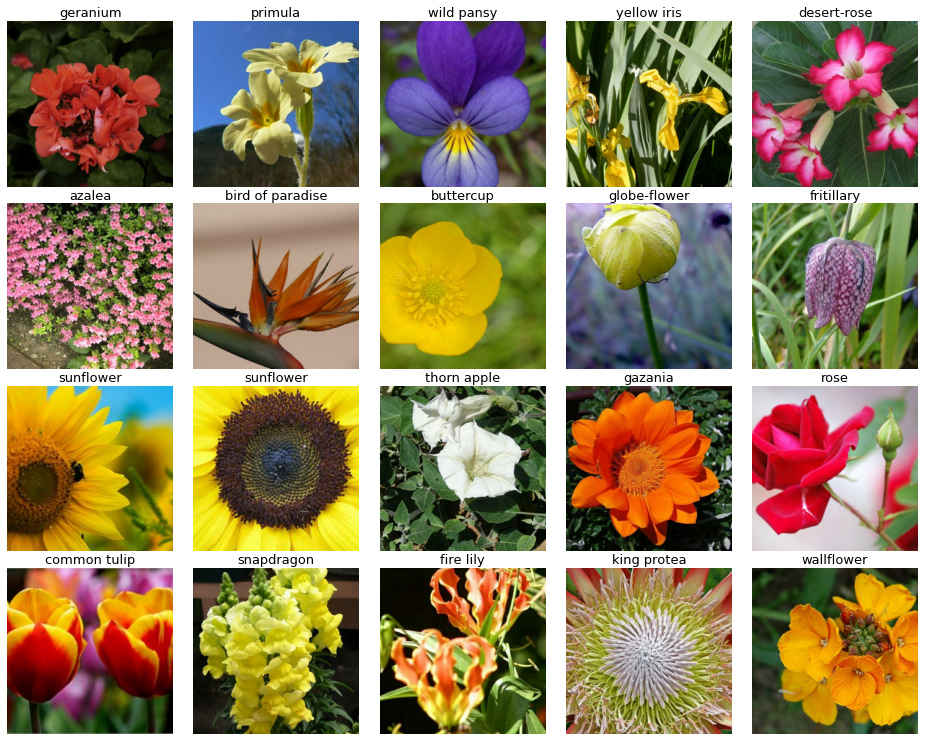

In [33]:
# Examining a batch of the training data
train_iter = iter(train_dataset.unbatch().batch(20))
train_batch = next(train_iter)
display_batch_of_images(train_batch)

# Every time we run this code we expect a different batch of 20 flower images to appear

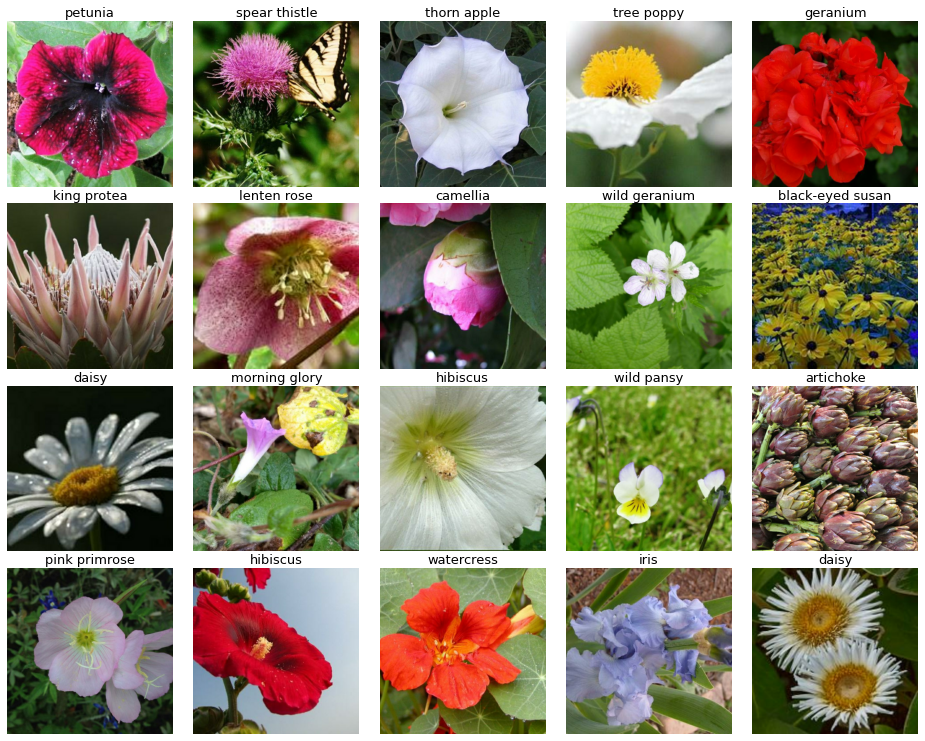

In [34]:
# Examining a batch of the valid data
valid_iter = iter(valid_dataset.unbatch().batch(20))
valid_batch = next(valid_iter)
display_batch_of_images(valid_batch)

# Every time we run this code we expect a different batch of 20 flower images to appear

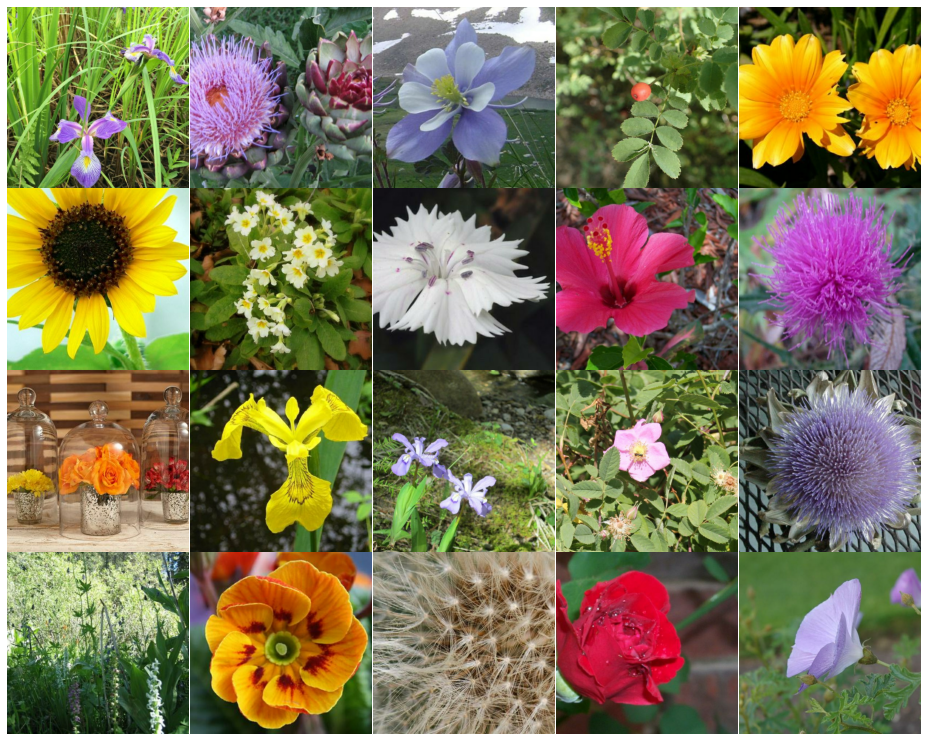

In [35]:
# Examining a batch of the test data
test_iter = iter(test_dataset.unbatch().batch(20))
test_batch = next(test_iter)
display_batch_of_images(test_batch)

# Every time we run this code we expect a different batch of 20 flower images to appear

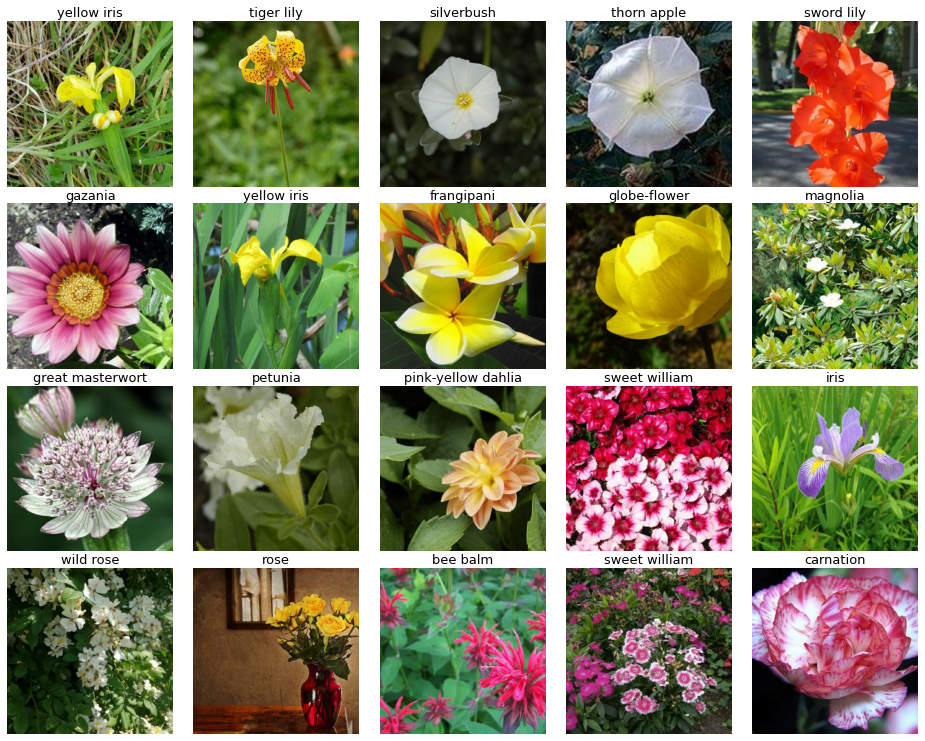

In [36]:
display_batch_of_images(next(iter(get_training_dataset().unbatch().batch(20))))

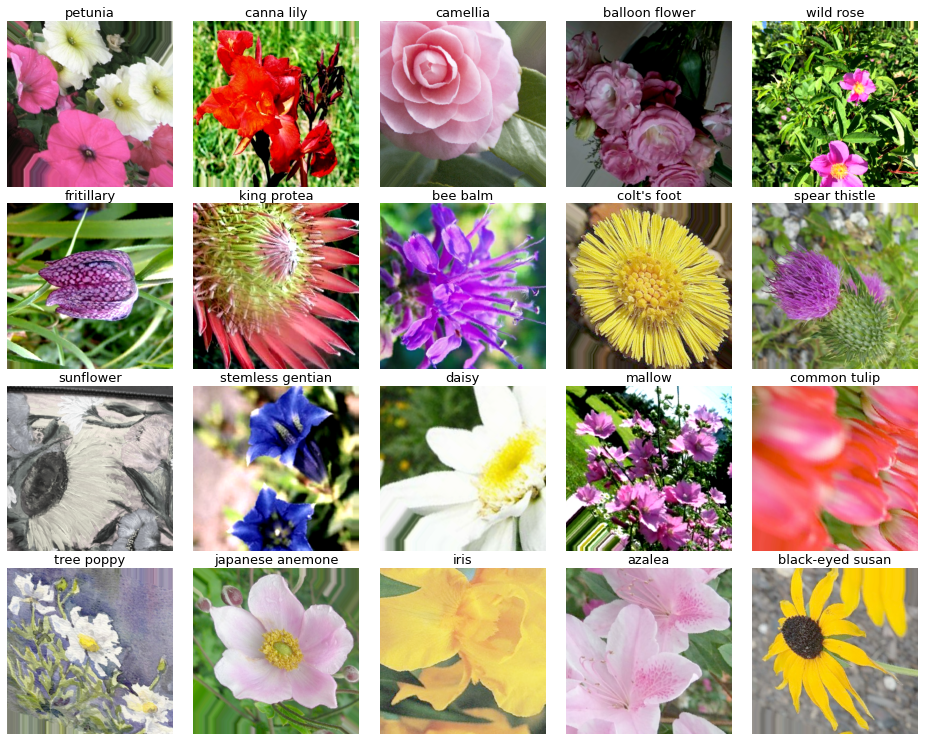

In [37]:
display_batch_of_images(next(iter(get_training_dataset(aug='new').unbatch().batch(20))))

In [38]:
# strategy.scope splits the work amongst the TPU cores so when using TensorFlow with TPUs
# it is important to properly use strategy.scope

# Model the data
with strategy.scope():
    model = create_model((None, None, CHANNELS), NUM_CLASSES)

# Generate the model and output the summary of the results
# model.compile(
#     optimizer=optimizers.Adam(lr=WARMUP_LEARNING_RATE),
#     loss = 'sparse_categorical_crossentropy',
#     metrics=['sparse_categorical_accuracy'],
# )

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b6 (Functional) (None, None, None, 2304)  40960136  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2304)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 104)               239720    
Total params: 41,199,856
Trainable params: 239,720
Non-trainable params: 40,960,136
_________________________________________________________________


In [39]:
# STEPS_PER_EPOCH = NUM_TRAINING_IMAGES // BATCH_SIZE
# warmup_history = model.fit(x=get_training_dataset(), 
#                            steps_per_epoch=STEPS_PER_EPOCH, 
#                            validation_data=get_validation_dataset(),
#                            epochs=3, 
#                            verbose=2).history

Learning rate schedule: 1e-08 to 0.00024 to 1e-06


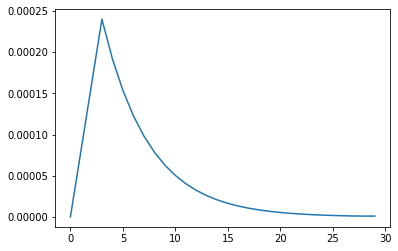

In [40]:
# Generate a learning rate schedule for the model to train
lr_callback = tf.keras.callbacks.LearningRateScheduler(exponential_schedule_with_warmup, verbose=True)

rng = [i for i in range(EPOCHS)]
y = [exponential_schedule_with_warmup(x) for x in rng]
plt.plot(rng, y)
print("Learning rate schedule: {:.3g} to {:.3g} to {:.3g}".format(y[0], max(y), y[-1]))

In [41]:
# Now on to training the model using that learning rate,
# with the number of epochs we want to use this might take
# some time. Remember to check our losses to ensure we arent
# over- or under-fitting.

for layer in model.layers:
    layer.trainable = True
    
checkpoint = ModelCheckpoint(model_path, monitor='val_lines', mode='min', save_best_only=True)

es = EarlyStopping(monitor='val_loss', mode='min', patience=ES_PATIENCE,
                  restore_best_weights=True, verbose=1)

lr_callback = LearningRateScheduler(exponential_schedule_with_warmup, verbose=0)

callback_list = [checkpoint, es, lr_callback]

model.compile(optimizer=optimizers.Adam(lr=LEARNING_RATE),
              loss='sparse_categorical_crossentropy',
              metrics=['sparse_categorical_accuracy'])

In [42]:
STEPS_PER_EPOCH = NUM_TRAINING_IMAGES // BATCH_SIZE
history = model.fit(
    get_training_dataset(),
    validation_data=valid_dataset,
    epochs=EPOCHS,
    steps_per_epoch=STEPS_PER_EPOCH,
    callbacks=callback_list,
    verbose=2
).history

Epoch 1/30
99/99 - 238s - loss: 4.7051 - sparse_categorical_accuracy: 0.0082 - val_loss: 4.6740 - val_sparse_categorical_accuracy: 0.0084


2021-12-26 15:37:56.569155: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 161965, Output num: 1
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1640533076.568954303","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 161965, Output num: 1","grpc_status":3}


Epoch 2/30
99/99 - 68s - loss: 3.4322 - sparse_categorical_accuracy: 0.2846 - val_loss: 2.1383 - val_sparse_categorical_accuracy: 0.5628
Epoch 3/30
99/99 - 68s - loss: 1.2977 - sparse_categorical_accuracy: 0.6978 - val_loss: 0.5991 - val_sparse_categorical_accuracy: 0.8481
Epoch 4/30
99/99 - 68s - loss: 0.5826 - sparse_categorical_accuracy: 0.8554 - val_loss: 0.3318 - val_sparse_categorical_accuracy: 0.9224
Epoch 5/30
99/99 - 67s - loss: 0.3456 - sparse_categorical_accuracy: 0.9149 - val_loss: 0.2601 - val_sparse_categorical_accuracy: 0.9394
Epoch 6/30
99/99 - 68s - loss: 0.2305 - sparse_categorical_accuracy: 0.9443 - val_loss: 0.2130 - val_sparse_categorical_accuracy: 0.9488
Epoch 7/30
99/99 - 68s - loss: 0.1631 - sparse_categorical_accuracy: 0.9605 - val_loss: 0.2017 - val_sparse_categorical_accuracy: 0.9526
Epoch 8/30
99/99 - 68s - loss: 0.1304 - sparse_categorical_accuracy: 0.9684 - val_loss: 0.1988 - val_sparse_categorical_accuracy: 0.9555
Epoch 9/30
99/99 - 68s - loss: 0.1105 - s

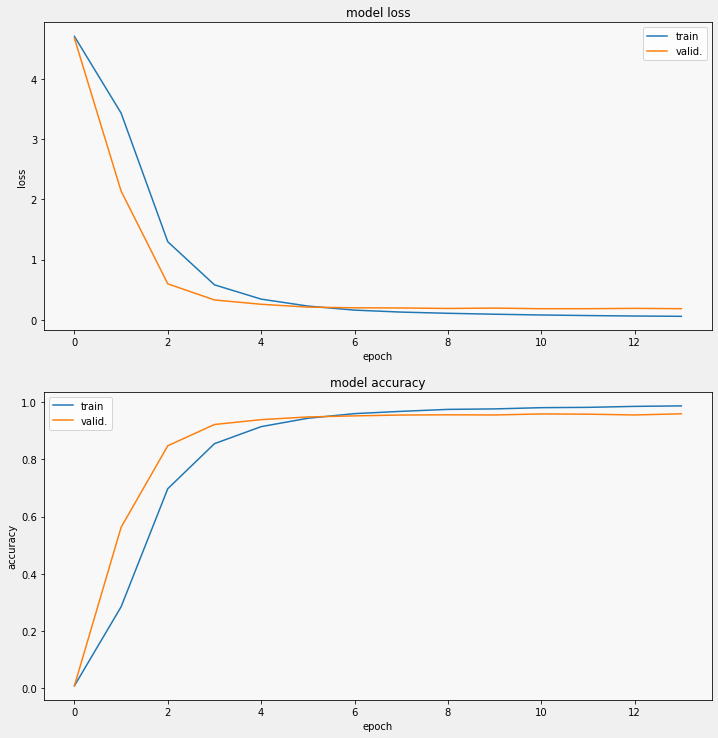

In [43]:
# Now that we've trained the model, lets look at our loss and see if we've over or underfit the data
display_training_curves(
    history['loss'],
    history['val_loss'],
    'loss',
    211,
)
display_training_curves(
    history['sparse_categorical_accuracy'],
    history['val_sparse_categorical_accuracy'],
    'accuracy',
    212,
)

In [44]:
# Generate the values used in a confusion matrix to visually see if our algorithm works well
# The matrix has a lot of components so it will take some time to generate

cmdataset = get_validation_dataset(ordered=True)
images_ds = cmdataset.map(lambda image, label: image)
labels_ds = cmdataset.map(lambda image, label: label).unbatch()

cm_correct_labels = next(iter(labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
cm_probabilities = model.predict(images_ds)
cm_predictions = np.argmax(cm_probabilities, axis=-1)

labels = range(len(CLASSES))
cmat = confusion_matrix(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
)
cmat = (cmat.T / cmat.sum(axis=1)).T # normalize

2021-12-26 15:53:40.090579: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 252904, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1640534020.090129240","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 252904, Output num: 0","grpc_status":3}


In [45]:
score = f1_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
precision = precision_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)
recall = recall_score(
    cm_correct_labels,
    cm_predictions,
    labels=labels,
    average='macro',
)

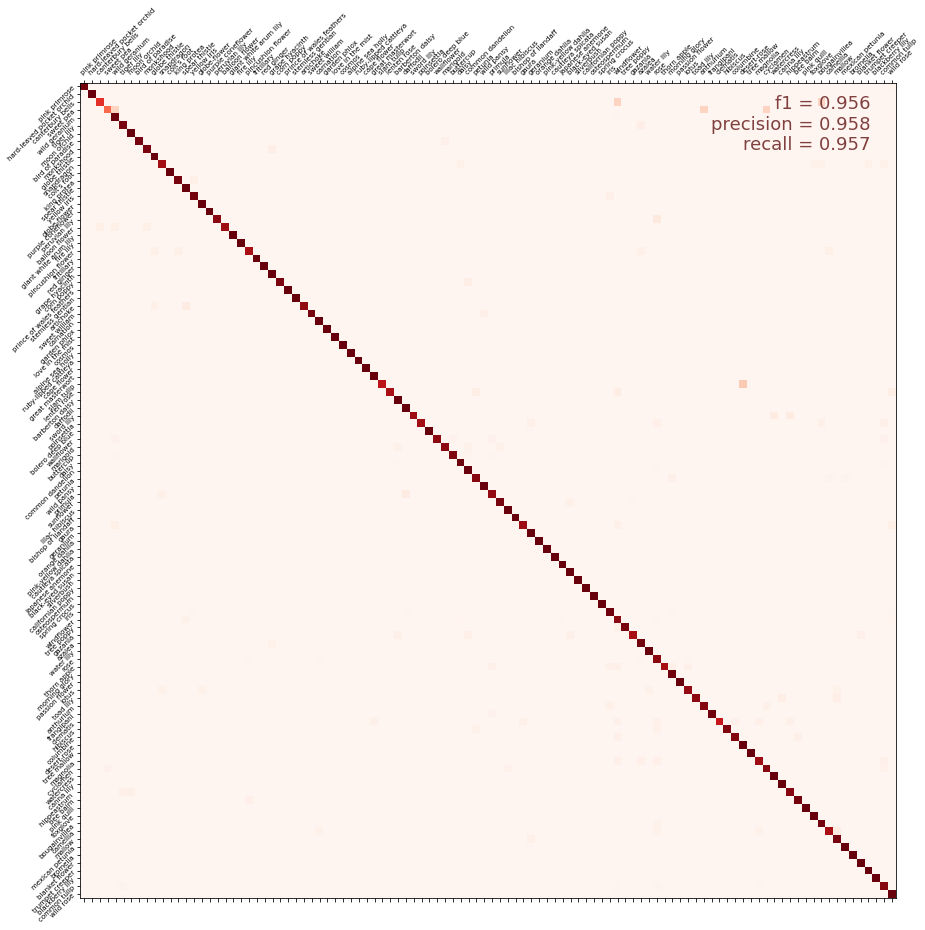

In [46]:
# Generate the confusion matrix with F-score, precision and recall shown on the plot
display_confusion_matrix(cmat, score, precision, recall)

In [47]:
# Get the validation data
dataset = get_validation_dataset()
dataset = dataset.unbatch().batch(20)
batch = iter(dataset)

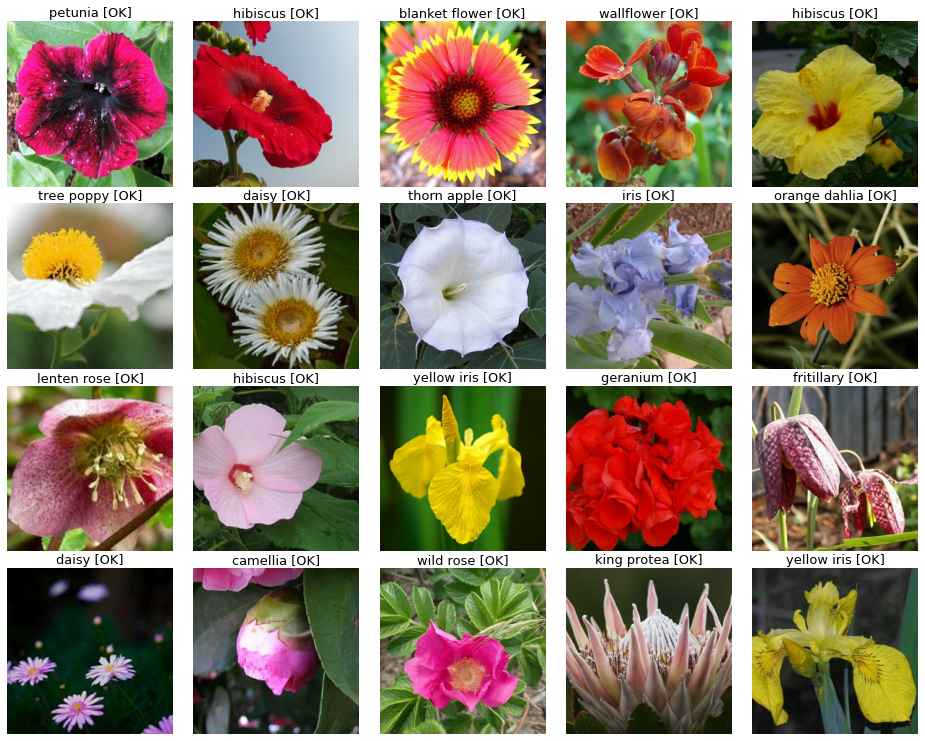

In [48]:
# Compare our model predictions to the actual flower
images, labels = next(batch)
probabilities = model.predict(images)
predictions = np.argmax(probabilities, axis=-1)
display_batch_of_images((images, labels), predictions)

In [49]:
test_ds = get_test_dataset(ordered=True)

print('Computing predictions...')
test_images_ds = test_ds.map(lambda image, idnum: image)
probabilities = model.predict(test_images_ds)
predictions = np.argmax(probabilities, axis=-1)
print(predictions)

Computing predictions...
[ 67  28  83 ... 103 102  62]


In [51]:
# Generate the submission
print('Generating submission.csv file...')

# Get image ids from test set and convert to unicode
test_ids_ds = test_ds.map(lambda image, idnum: idnum).unbatch()
test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U')

# Write the submission file
np.savetxt(
    'tpu-getting-started-using-pretrained-models-submission.csv',
    np.rec.fromarrays([test_ids, predictions]),
    fmt=['%s', '%d'],
    delimiter=',',
    header='id,label',
    comments='',
)

Generating submission.csv file...
